# Machine Learning Engineer Nanodegree


## Capstone Project
## Vision-Perception Module - Situational Awareness System for Autonomous Vehicles
## 03 - Apply CNN with Transfer Learning from AlexNet

Kamil Kaczmarczyk
September 10th, 2017
***

## Import & Initialize

In [2]:
### Import the libraries

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import os
import time
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from scipy.ndimage.measurements import label
from scipy import ndimage
from scipy.misc import imresize
import tensorflow as tf
import random

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import codecs

%matplotlib inline

print("END")

END


## Creating new AlexNet from pre-built weights

In [ ]:
'''
Parts of the AlexNet Transfer learning implementation in this Capstone project
were inspired by the TensorFlow Workshops available on: 
https://github.com/samjabrahams/tensorflow-workshop
'''

In [3]:
variable_data = np.load("saved_models/bvlc-alexnet.npy", encoding='bytes').item()

In [4]:
type(variable_data)

dict

In [5]:
conv1_preW = variable_data["conv1"][0]
conv1_preb = variable_data["conv1"][1]
print(conv1_preW.shape)
print(conv1_preb.shape)

(11, 11, 3, 96)
(96,)


In [6]:
conv2_preW = variable_data["conv2"][0]
conv2_preb = variable_data["conv2"][1]
print(conv2_preW.shape)
print(conv2_preb.shape)

(5, 5, 48, 256)
(256,)


In [7]:
conv3_preW = variable_data["conv3"][0]
conv3_preb = variable_data["conv3"][1]
print(conv3_preW.shape)
print(conv3_preb.shape)

(3, 3, 256, 384)
(384,)


In [8]:
conv4_preW = variable_data["conv4"][0]
conv4_preb = variable_data["conv4"][1]
print(conv4_preW.shape)
print(conv4_preb.shape)

(3, 3, 192, 384)
(384,)


In [9]:
conv5_preW = variable_data["conv5"][0]
conv5_preb = variable_data["conv5"][1]
print(conv5_preW.shape)
print(conv5_preb.shape)

(3, 3, 192, 256)
(256,)


In [10]:
fc6_preW = variable_data["fc6"][0]
fc6_preb = variable_data["fc6"][1]
print(fc6_preW.shape)
print(fc6_preb.shape)

(9216, 4096)
(4096,)


In [11]:
fc7_preW = variable_data["fc7"][0]
fc7_preb = variable_data["fc7"][1]
print(fc7_preW.shape)
print(fc7_preb.shape)

(4096, 4096)
(4096,)


In [12]:
fc8_preW = variable_data["fc8"][0]
fc8_preb = variable_data["fc8"][1]
print(fc8_preW.shape)
print(fc8_preb.shape)

(4096, 1000)
(1000,)


## Create AlexNet 

In [ ]:
pixel_depth = 255.0
resized_height = 227
resized_width = 227
num_channels = 3

graph = tf.Graph()

with graph.as_default():
    x = tf.placeholder(tf.uint8, [None, None, None, num_channels],
                       name='input')
    
    to_float = tf.cast(x, tf.float32)
    #resized = tf.image.resize_images(to_float, resized_height, resized_width)
    resized = tf.image.resize_images(to_float, (resized_height, resized_width))
    
    # Convolution 1
    with tf.name_scope('conv1') as scope:
        kernel = tf.Variable(conv1_preW, name='weights')
        biases = tf.Variable(conv1_preb, name='biases')
        conv = tf.nn.conv2d(resized, kernel, [1, 4, 4, 1], padding="SAME")
        bias = tf.nn.bias_add(conv, biases)
        conv1 = tf.nn.relu(bias, name=scope)

    # Local response normalization 2
    radius = 2
    alpha = 2e-05
    beta = 0.75
    bias = 1.0
    lrn1 = tf.nn.local_response_normalization(conv1,
                                              depth_radius=radius,
                                              alpha=alpha,
                                              beta=beta,
                                              bias=bias)

    # Maxpool 1
    pool1 = tf.nn.max_pool(lrn1,
                           ksize=[1, 3, 3, 1],
                           strides=[1, 2, 2, 1],
                           padding='VALID',
                           name='pool1')

    # Convolution 2
    with tf.name_scope('conv2') as scope:

        kernel = tf.Variable(conv2_preW, name='weights')
        biases = tf.Variable(conv2_preb, name='biases')

        input_a, input_b = tf.split(split_dim=3,
                                    num_split=2,
                                    value=pool1)
        kernel_a, kernel_b = tf.split(split_dim=3,
                                      num_split=2,
                                      value=kernel)

        with tf.name_scope('A'):
            conv_a = tf.nn.conv2d(input_a, kernel_a, [1, 1, 1, 1], padding="SAME")        

        with tf.name_scope('B'):
            conv_b = tf.nn.conv2d(input_b, kernel_b, [1, 1, 1, 1], padding="SAME")

        conv = tf.concat(3, [conv_a, conv_b])
        bias = tf.nn.bias_add(conv, biases)
        conv2 = tf.nn.relu(bias, name=scope)

    # Local response normalization 2
    radius = 2
    alpha = 2e-05
    beta = 0.75
    bias = 1.0
    lrn2 = tf.nn.local_response_normalization(conv2,
                                              depth_radius=radius,
                                              alpha=alpha,
                                              beta=beta,
                                              bias=bias)

    # Maxpool 2
    pool2 = tf.nn.max_pool(lrn2,
                           ksize=[1, 3, 3, 1],
                           strides=[1, 2, 2, 1],
                           padding='VALID',
                           name='pool2')

    with tf.name_scope('conv3') as scope:
        kernel = tf.Variable(conv3_preW, name='weights')
        biases = tf.Variable(conv3_preb, name='biases')
        conv = tf.nn.conv2d(pool2, kernel, [1, 1, 1, 1], padding="SAME")
        bias = tf.nn.bias_add(conv, biases)
        conv3 = tf.nn.relu(bias, name=scope)


    with tf.name_scope('conv4') as scope:

        kernel = tf.Variable(conv4_preW, name='weights')
        biases = tf.Variable(conv4_preb, name='biases')

        input_a, input_b = tf.split(split_dim=3,
                                    num_split=2,
                                    value=conv3)
        kernel_a, kernel_b = tf.split(split_dim=3,
                                      num_split=2,
                                      value=kernel)

        with tf.name_scope('A'):
            conv_a = tf.nn.conv2d(input_a, kernel_a, [1, 1, 1, 1], padding="SAME")        

        with tf.name_scope('B'):
            conv_b = tf.nn.conv2d(input_b, kernel_b, [1, 1, 1, 1], padding="SAME")

        conv = tf.concat(3, [conv_a, conv_b])
        bias = tf.nn.bias_add(conv, biases)
        conv4 = tf.nn.relu(bias, name=scope)


    with tf.name_scope('conv5') as scope:

        kernel = tf.Variable(conv5_preW, name='weights')
        biases = tf.Variable(conv5_preb, name='biases')

        input_a, input_b = tf.split(split_dim=3,
                                    num_split=2,
                                    value=conv4)
        kernel_a, kernel_b = tf.split(split_dim=3,
                                      num_split=2,
                                      value=kernel)

        with tf.name_scope('A'):
            conv_a = tf.nn.conv2d(input_a, kernel_a, [1, 1, 1, 1], padding="SAME")        

        with tf.name_scope('B'):
            conv_b = tf.nn.conv2d(input_b, kernel_b, [1, 1, 1, 1], padding="SAME")

        conv = tf.concat(3, [conv_a, conv_b])
        bias = tf.nn.bias_add(conv, biases)
        conv5 = tf.nn.relu(bias, name=scope)


    # Maxpool 2
    pool5 = tf.nn.max_pool(conv5,
                           ksize=[1, 3, 3, 1],
                           strides=[1, 2, 2, 1],
                           padding='VALID',
                           name='pool5')

    # Fully connected 6
    with tf.name_scope('fc6'):
        weights = tf.Variable(fc6_preW, name='fc6_weights')
        bias = tf.Variable(fc6_preb, name='fc6_bias')
        shape = tf.shape(pool5)
        size = shape[1] * shape[2] * shape[3]
        fc6 = tf.nn.relu_layer(tf.reshape(pool5, [-1, size]),
                               weights, bias, name='relu')

    # Fully connected 7
    with tf.name_scope('fc7'):
        weights = tf.Variable(fc7_preW, name='weights')
        bias = tf.Variable(fc7_preb, name='bias')
        fc7 = tf.nn.relu_layer(fc6, weights, bias, name='relu')

    # Fully connected 8
    with tf.name_scope('fc8'):
        weights = tf.Variable(fc8_preW, name='weights')
        bias = tf.Variable(fc8_preb, name='bias')
        # fc8 = tf.matmul(fc7, weights) + bias
        fc8 = tf.nn.xw_plus_b(fc7, weights, bias)

    softmax = tf.nn.softmax(fc8)

    #init = tf.initialize_all_variables()
    init = tf.global_variables_initializer()

In [ ]:
sess = tf.Session(graph=graph)
sess.run(init)

#writer = tf.train.SummaryWriter('tensorboard/alexnet', graph=graph)
writer = tf.summary.FileWriter('tensorboard/alexnet', graph=graph)
writer.close()

In [ ]:
with graph.as_default():
    saver = tf.train.Saver()
    save_path = saver.save(sess, 'saved_models/alex_vars')

## Adding the transfer layer to AlexNet

In [2]:
graph = tf.Graph()
with graph.as_default():
    importer = tf.train.import_meta_graph('saved_models/alex_vars.meta')

sess = tf.Session(graph=graph)
importer.restore(sess, 'saved_models/alex_vars')

In [3]:
fc7_op = graph.get_operation_by_name('fc7/relu')
fc7 = fc7_op.outputs[0]

In [4]:
fc7.get_shape()

TensorShape([Dimension(None), Dimension(4096)])

## Create new layer `fc8` - attached to `fc7`

In [5]:
# Create new final layer
with graph.as_default():
    x = graph.get_operation_by_name('input').outputs[0]
    
    with tf.name_scope('transfer'):
        labels = tf.placeholder(tf.int32, [None])
        one_hot_labels = tf.one_hot(labels, 4)

        with tf.name_scope('aircraft_birds_final_layer'):
            weights = tf.Variable(tf.truncated_normal([4096, 4], stddev=0.001),
                                  name='final_weights')
            biases = tf.Variable(tf.zeros([4]), name='final_biases')
            logits = tf.nn.xw_plus_b(fc7, weights, biases, name='logits')

        prediction = tf.nn.softmax(logits, name='aircraft_birds_softmax')
        cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits, one_hot_labels)
        loss = tf.reduce_mean(cross_entropy, name='aircraft_birds_loss')

        global_step = tf.Variable(0, trainable=False, name='global_step')
        inc_step = global_step.assign_add(1)

        cat_dog_variables = [weights, biases]
        train = tf.train.GradientDescentOptimizer(0.01).minimize(loss, global_step=global_step,
                                                                var_list=cat_dog_variables) 
    
    with tf.name_scope('accuracy'):
        label_prediction = tf.argmax(prediction, 1, name='predicted_label')
        correct_prediction = tf.equal(label_prediction, tf.argmax(one_hot_labels, 1))
        accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
    
    
    #init = tf.initialize_all_variables()
    init = tf.global_variables_initializer()

In [6]:
sess = tf.Session(graph=graph)
sess.run(init)

## Get our training file names

In [7]:
aircraft_files = [
    'dataset_v2/aircraft_1/' + f
    for 
    f
    in
    os.listdir('dataset_v2/aircraft_1')
]

birds_files = [
    'dataset_v2/birds_1/' + f
    for 
    f
    in
    os.listdir('dataset_v2/birds_1')
]

sky_files = [
    'dataset_v2/sky_1/' + f
    for 
    f
    in
    os.listdir('dataset_v2/sky_1')
]

ground_files = [
    'dataset_v2/ground_1/' + f
    for 
    f
    in
    os.listdir('dataset_v2/ground_1')
]

all_files = aircraft_files + birds_files + sky_files + ground_files

## Shuffle and split into training/validation

In [8]:
random.shuffle(all_files)

In [9]:
num_files = len(all_files)
valid_percentage = 0.3
split = int(num_files * valid_percentage)
valid_data = all_files[:split]
train_data = all_files[split:]

In [10]:
print('Number of training images: {}'.format(len(train_data)))
print('Number of validation images: {}'.format(len(valid_data)))

Number of training images: 1107
Number of validation images: 474


## Define a function to get batches of data

In [11]:
flip_left_right = True
random_crop = 1
random_scale = 1
random_brightness = 1
num_channels = 3
height = 227
width = 227
pixel_depth = 255.0

In [12]:
import ntpath

def get_batch(batch_size, data, max_epochs, should_distort=False):
    distort_graph = tf.Graph()
    with distort_graph.as_default():
        """
        From https://github.com/tensorflow/tensorflow/blob/master/tensorflow/examples/image_retraining/retrain.py
        """
        jpeg_name = tf.placeholder(tf.string, name='DistortJPGInput')
        jpeg_data = tf.read_file(jpeg_name)
        decoded_image = tf.image.decode_jpeg(jpeg_data, channels=3)
        #resized_image = tf.image.resize_images(decoded_image, height, width)
        resized_image = tf.image.resize_images(decoded_image, (height, width))
        if should_distort:
            decoded_image_as_float = tf.cast(decoded_image, dtype=tf.float32)
            decoded_image_4d = tf.expand_dims(decoded_image_as_float, 0)
            margin_scale = 1.0 + (random_crop / 100.0)
            resize_scale = 1.0 + (random_scale / 100.0)
            margin_scale_value = tf.constant(margin_scale)
            resize_scale_value = tf.random_uniform(tf.python.framework.tensor_shape.scalar(),
                                                 minval=1.0,
                                                 maxval=resize_scale)
            scale_value = tf.mul(margin_scale_value, resize_scale_value)
            precrop_width = tf.mul(scale_value, width)
            precrop_height = tf.mul(scale_value, width)
            precrop_shape = tf.pack([precrop_height, precrop_width])
            precrop_shape_as_int = tf.cast(precrop_shape, dtype=tf.int32)
            precropped_image = tf.image.resize_bilinear(decoded_image_4d,
                                                      precrop_shape_as_int)
            precropped_image_3d = tf.squeeze(precropped_image, squeeze_dims=[0])
            cropped_image = tf.random_crop(precropped_image_3d,
                                         [width, width,
                                          num_channels])
            if flip_left_right:
                flipped_image = tf.image.random_flip_left_right(cropped_image)
            else:
                flipped_image = cropped_image
            brightness_min = 1.0 - (random_brightness / 100.0)
            brightness_max = 1.0 + (random_brightness / 100.0)
            brightness_value = tf.random_uniform(tf.python.framework.tensor_shape.scalar(),
                                               minval=brightness_min,
                                               maxval=brightness_max)
            brightened_image = tf.mul(flipped_image, brightness_value)
            distort_result = tf.expand_dims(brightened_image, 0, name='DistortResult')

    distort_sess = tf.Session(graph=distort_graph)
    
    epoch = 0
    idx = 0
    while epoch < max_epochs: 
        batch = []
        labels = []
        for i in range(batch_size):
            if idx + i >= len(data):
                random.shuffle(data)
                epoch += 1
                idx = 0
            image_path = data[idx + i].encode()
            if should_distort:
                val = distort_sess.run(distort_result, 
                                       feed_dict={jpeg_name: image_path})
            else:
                val = distort_sess.run(resized_image, 
                                       feed_dict={jpeg_name: image_path})
            if  image_path.find(b'aircraft') != -1:
                labels.append(3)
            elif image_path.find(b'birds') != -1:
                labels.append(2)
            elif image_path.find(b'sky') != -1:
                labels.append(1)
            else:
                labels.append(0)
            batch.append(val)
        idx += batch_size
        yield batch, labels

In [13]:
sess.run(init)

In [ ]:
writer = tf.summary.FileWriter('tensorboard/alexnet_retrain', graph=graph)
writer.close()

## Model Training

In [15]:
#for data_batch, label_batch in get_batch(32, train_data, 1, should_distort=False):
for data_batch, label_batch in get_batch(32, train_data, 10, should_distort=False):
    data_batch = np.squeeze(data_batch)
    feed_dict = {x: data_batch, labels: label_batch}
    err, acc, step, _ = sess.run([loss, accuracy, inc_step, train],
                            feed_dict=feed_dict)
    if step % 50 == 0:
        print("Step: {}\t Accuracy: {}\t Error: {}".format(step, acc, err))

Step: 50	 Accuracy: 1.0	 Error: 0.0797063410282135
Step: 100	 Accuracy: 1.0	 Error: 0.04548795521259308
Step: 150	 Accuracy: 1.0	 Error: 0.05665541812777519
Step: 200	 Accuracy: 1.0	 Error: 0.013973279856145382
Step: 250	 Accuracy: 1.0	 Error: 0.011247647926211357
Step: 300	 Accuracy: 1.0	 Error: 0.02679961360991001
Step: 350	 Accuracy: 1.0	 Error: 0.02531445026397705
Step: 400	 Accuracy: 1.0	 Error: 0.013208027929067612
Step: 450	 Accuracy: 1.0	 Error: 0.018722526729106903
Step: 500	 Accuracy: 1.0	 Error: 0.01248718798160553
Step: 550	 Accuracy: 1.0	 Error: 0.004433698020875454
Step: 600	 Accuracy: 1.0	 Error: 0.007406702730804682
Step: 650	 Accuracy: 1.0	 Error: 0.004513563588261604


## Model Validation

In [16]:
def check_accuracy(valid_data):
    #batch_size = 50
    batch_size = 10
    #batch_size = 5
    num_correct = 0
    total = len(valid_data)
    i = 0
    for data_batch, label_batch in get_batch(batch_size, valid_data, 1):
        feed_dict = {x: data_batch, labels: label_batch}
        correct_guesses = sess.run(correct_prediction,
                                   feed_dict=feed_dict)
        num_correct += np.sum(correct_guesses)
        i += batch_size
        if i % (batch_size * 10) == 0:
            print('\tIntermediate accuracy: {}'.format((float(num_correct) / float(i))))
    acc = num_correct / float(total)
    print('\nAccuracy: {}'.format(acc))

In [17]:
check_accuracy(valid_data)

	Intermediate accuracy: 0.98
	Intermediate accuracy: 0.98
	Intermediate accuracy: 0.9733333333333334
	Intermediate accuracy: 0.98

Accuracy: 0.9915611814345991


## Random dataset pictures inspection

In [18]:
def spot_check():
    filename = random.choice(valid_data)
    image = ndimage.imread(filename)
    feed_dict = {x: [image]}
    guess = sess.run(label_prediction, feed_dict=feed_dict)  
    if guess[0] == 3:
        print('Guess: aircraft')
    elif guess[0] == 2:
        print('Guess: bird')
    elif guess[0] == 1:
        print('Guess: sky')
    else:
        print('Guess: ground')
    plt.imshow(image)
    plt.show()

Guess: aircraft


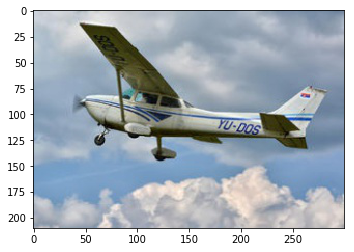

In [19]:
spot_check()

Guess: bird


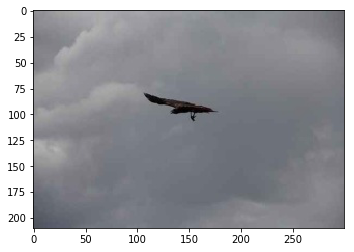

Guess: sky


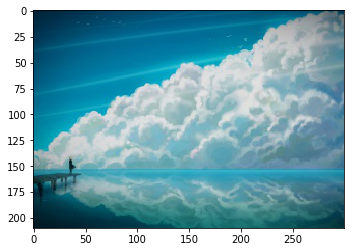

Guess: sky


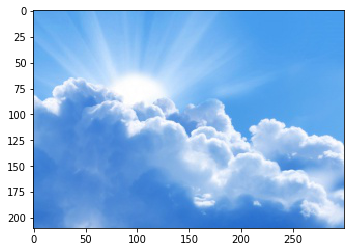

Guess: aircraft


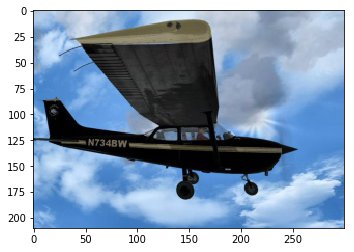

Guess: aircraft


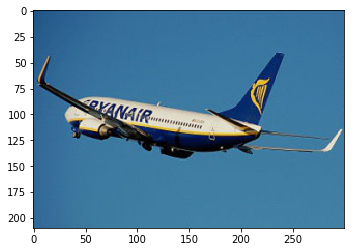

Guess: ground


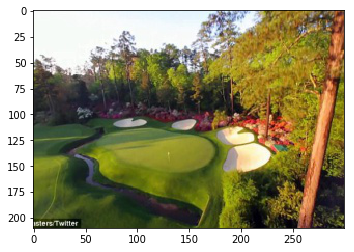

Guess: sky


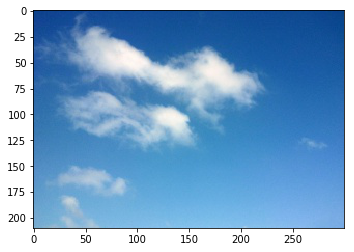

Guess: sky


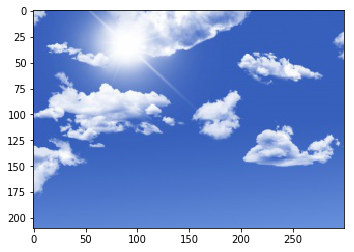

Guess: sky


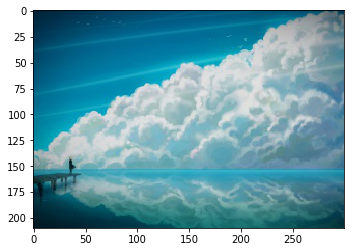

Guess: aircraft


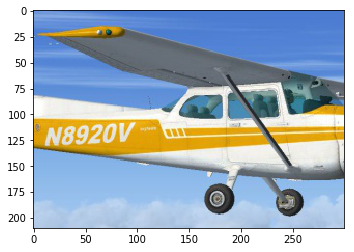

In [20]:
#for i in range(100):
for i in range(10):
    spot_check()

## Test pictures inspection 

Guess: bird


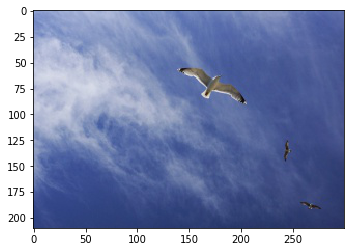

In [21]:
def classify(image):
    feed_dict = {x: [image]}
    guess = sess.run(label_prediction, feed_dict=feed_dict)
    if guess[0] == 3:
        print('Guess: aircraft')
    elif guess[0] == 2:
        print('Guess: bird')
    elif guess[0] == 1:
        print('Guess: sky')
    else:
        print('Guess: ground')
    plt.imshow(image)
    plt.show()
    
filename = random.choice(valid_data)
image = ndimage.imread(filename)
classify(image)

Guess: aircraft


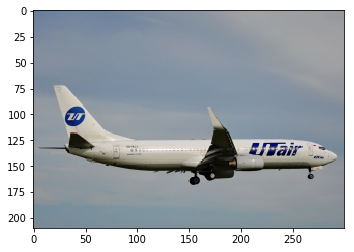

Guess: aircraft


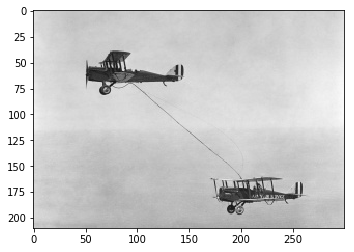

Guess: ground


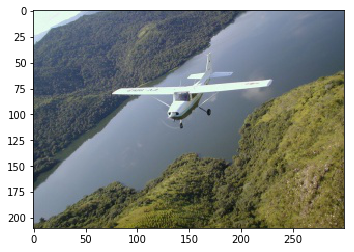

Guess: aircraft


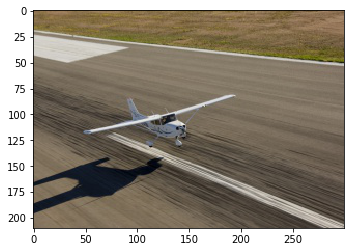

Guess: aircraft


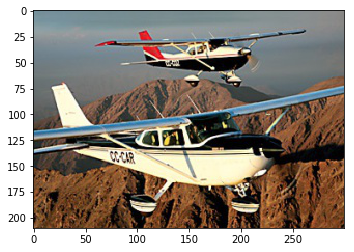

Guess: bird


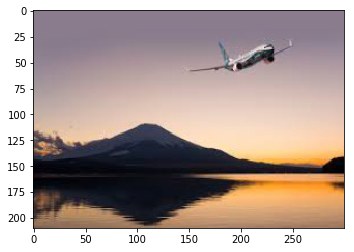

Guess: aircraft


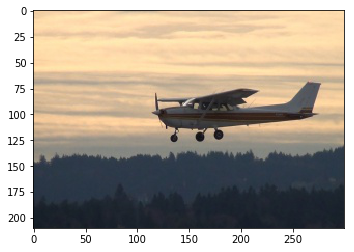

Guess: bird


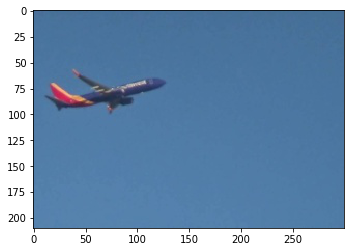

Guess: sky


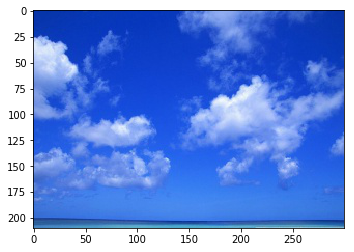

Guess: bird


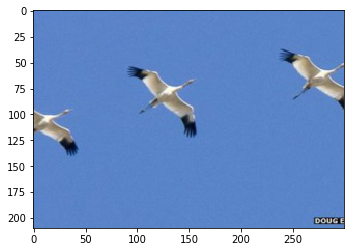

Guess: ground


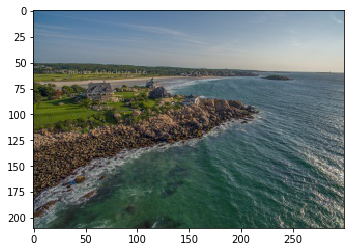

Guess: bird


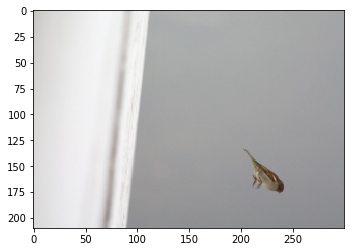

Guess: ground


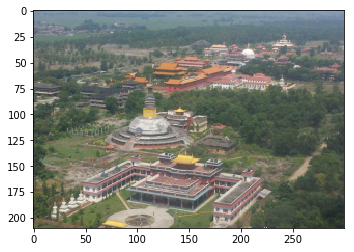

Guess: bird


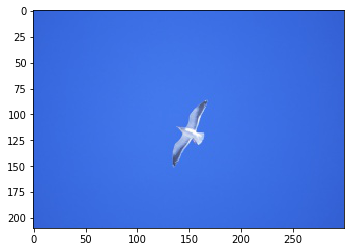

Guess: ground


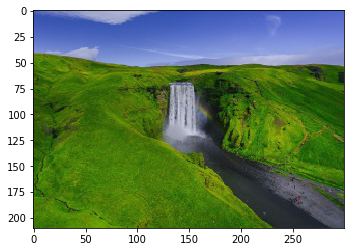

Guess: ground


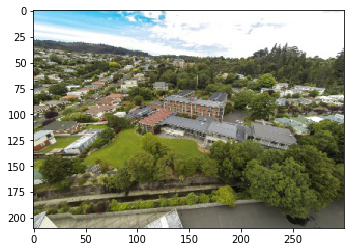

Guess: aircraft


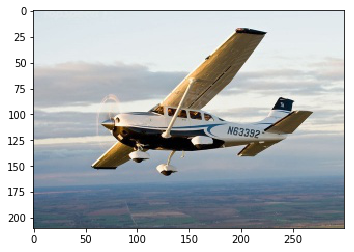

Guess: bird


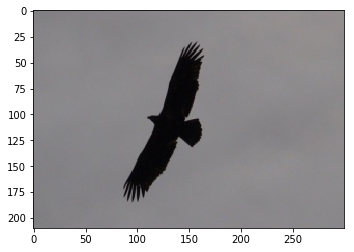

Guess: sky


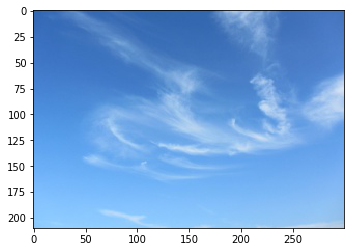

Guess: sky


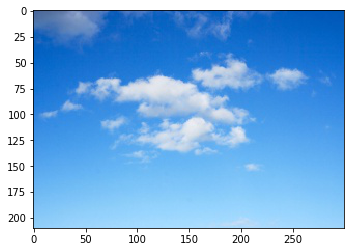

In [22]:
import glob
import matplotlib.image as mpimg

searchpath = 'test_images_2/*'  
example_images = glob.glob(searchpath)

images = []
titles = []

for img_src in example_images:
    img = mpimg.imread(img_src)
    classify(img)

## Prepare the functions for the classification pipeline 

In [23]:
def just_classify(image):
    feed_dict = {x: [image]}
    guess = sess.run(label_prediction, feed_dict=feed_dict)
    #probabilities = sess.run(prediction, feed_dict=feed_dict)
    #return guess, probabilities
    return guess

In [ ]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

In [24]:
###
### Sliding window functions
###
    
def detect_objects(img, scales, overlap, mask=None):
    
    heatmap_aircraft = np.zeros_like(img[:,:,0])
    heatmap_birds = np.zeros_like(img[:,:,0])
    
    for scale in scales:
        xy_window = int(img.shape[1]*scale)
        if mask is not None:
            #mask = ((0,img.shape[0]/2), (0,img.shape[1]))
            #mask = ((img.shape[0]/6,img.shape[0]/2), (2*img.shape[1]/5,3*img.shape[1]/5))
            x_start_stop = [mask[1][0], mask[1][1]]
            y_start_stop = [mask[0][0], mask[0][1]]
            #assume x > y in terms of image shape - scaling done in-line with x-dimension
            windows = slide_window(img, x_start_stop, y_start_stop, 
                        xy_window=(xy_window, xy_window), xy_overlap=(overlap, overlap))
        else:
            windows = slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                        xy_window=(xy_window, xy_window), xy_overlap=(overlap, overlap))
        
        for window in windows:
            
            window_img = img[window[0][1]:window[1][1], window[0][0]:window[1][0]]
            #guess, probabilities = just_classify(window_img)
            guess = just_classify(window_img)
            
            if guess == 3: #aircraft
                heatmap_aircraft[window[0][1]:window[1][1], window[0][0]:window[1][0]] += 1
            elif guess == 2: #birds
                heatmap_birds[window[0][1]:window[1][1], window[0][0]:window[1][0]] += 1
                
    #return draw_img, heatmap_aircraft, heatmap_birds
    return heatmap_aircraft, heatmap_birds

In [ ]:
#def visualize(fig, rows, cols, imgs, titles):
def visualize(fig, rows, cols, imgs):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            #plt.title(titles[i])
        else:
            plt.imshow(img)
            #plt.title(titles[i])

In [ ]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

## Run sliding windows & create classification heatmaps on test images 

In [25]:
searchpath = 'test_images_2/*'  
example_images = glob.glob(searchpath)

scales = [1, 0.4, 0.2, 0.1]
overlap = 0.5

out_images = []
out_heatmap_aircraft = []
out_heatmap_birds = []

for img_src in example_images:
    
    img = mpimg.imread(img_src)
    heatmap_aircraft, heatmap_birds = detect_objects(img, scales, overlap)
    
    out_images.append(img)
    out_images.append(heatmap_aircraft)
    out_images.append(heatmap_birds)
    
    out_heatmap_aircraft.append(heatmap_aircraft)
    out_heatmap_birds.append(heatmap_birds)

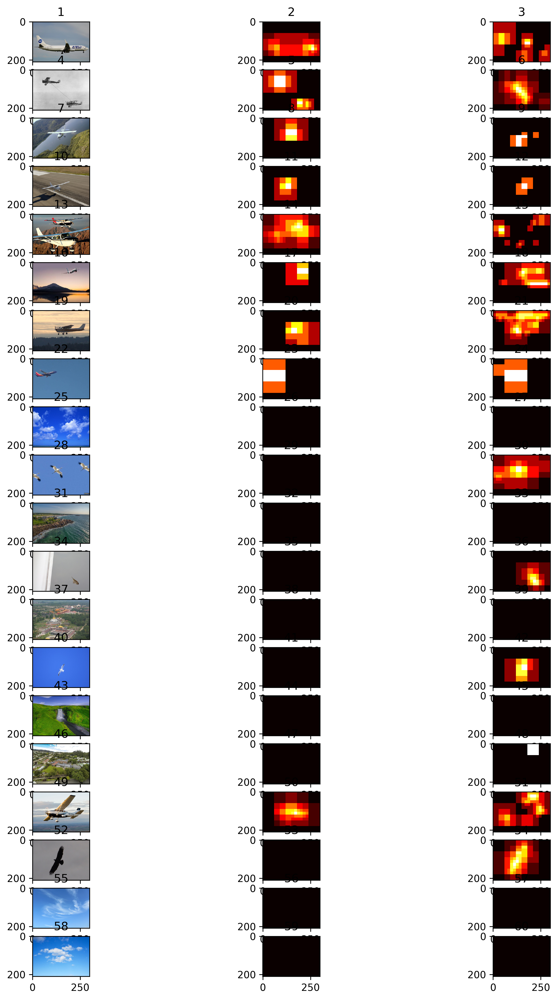

In [26]:
fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, len(example_images), 3, out_images)

# Column 1 - original test image |
# Column 2 - aircraft detections heatmap |
# Column 3 - birds detections heatmap 

In [27]:
#plt.imshow(window_img)
for i, img in enumerate(out_images):
    plt.imsave('test_images_results/out_images_0/'+str(i+1)+'.png',out_images[i])

## Apply thresholds on heatmaps of objects detections

In [28]:
#threshold_aircraft = 1
threshold_aircraft = 1
#threshold_birds = 5
threshold_birds = 6

out_images_th = []
out_heatmap_aircraft_th = []
out_heatmap_birds_th = []
i=0

for img_src in example_images:
    
    img = mpimg.imread(img_src)
    
    heatmap_aircraft = out_heatmap_aircraft[i]
    heatmap_aircraft_th = apply_threshold(heatmap_aircraft, threshold_aircraft)
    out_heatmap_aircraft_th.append(heatmap_aircraft_th)
    
    heatmap_birds = out_heatmap_birds[i]
    heatmap_birds_th = apply_threshold(heatmap_birds, threshold_birds)
    out_heatmap_birds_th.append(heatmap_birds_th) 
    
    out_images_th.append(img)
    out_images_th.append(heatmap_aircraft_th)
    out_images_th.append(heatmap_birds_th)
    
    i+=1

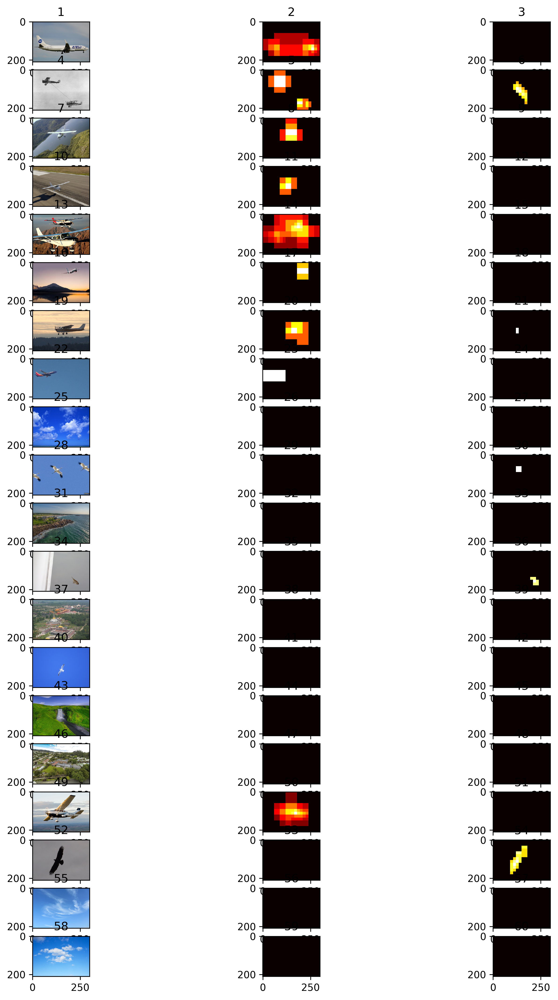

In [29]:
fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, len(example_images), 3, out_images_th)

# Column 1 - original test image |
# Column 2 - aircraft detections heatmap - thresholded | 
# Column 3 - birds detections heatmap - thresholded

In [30]:
#plt.imshow(window_img)
for i, img in enumerate(out_images_th):
    plt.imsave('test_images_results/out_images_th_1/'+str(i+1)+'.png',out_images_th[i])

## Draw bounding boxes around heatmap hotspots

In [31]:
#import cv2

def draw_labeled_bboxes(img, labels, color):
    # Iterate through all detected cars
    bboxes = []
    for object_number in range(1, labels[1]+1):
        # Find pixels with each object_number label value
        nonzero = (labels[0] == object_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        bboxes.append(bbox)
        cv2.rectangle(img, bbox[0], bbox[1], color, 6)
    # Return the image
    
    # Ensure variable is defined
    try:
        bbox
    except NameError:
        bbox = None

    return img, bbox

In [32]:
from scipy.ndimage.measurements import label
import cv2

out_images_labels = []
i = 0
color_aircraft = (0,0,255)
color_birds = (0,255,0)

for img_src in example_images:

    img = mpimg.imread(img_src)
    
    heatmap_aircraft_th = out_heatmap_aircraft_th[i]
    labels_aircraft = label(heatmap_aircraft_th)
    draw_img_aircraft, bbox_aircraft = draw_labeled_bboxes(np.copy(img), labels_aircraft, color_aircraft)
    
    #to avoid many false alerts in detecting sky as birds subtract from the birds heatmap the bounding boxes of aircraft
    heatmap_birds_th = out_heatmap_birds_th[i]
    if bbox_aircraft is not None:
        heatmap_birds_th[bbox_aircraft[0][1]:bbox_aircraft[1][1], bbox_aircraft[0][0]:bbox_aircraft[1][0]] = 0
    labels_birds = label(heatmap_birds_th)
    draw_img_birds, bbox_birds = draw_labeled_bboxes(np.copy(img), labels_birds, color_birds)
    
    out_images_labels.append(img)
    out_images_labels.append(draw_img_aircraft)
    out_images_labels.append(heatmap_aircraft_th)
    out_images_labels.append(draw_img_birds)
    out_images_labels.append(heatmap_birds_th)    
    
    i += 1

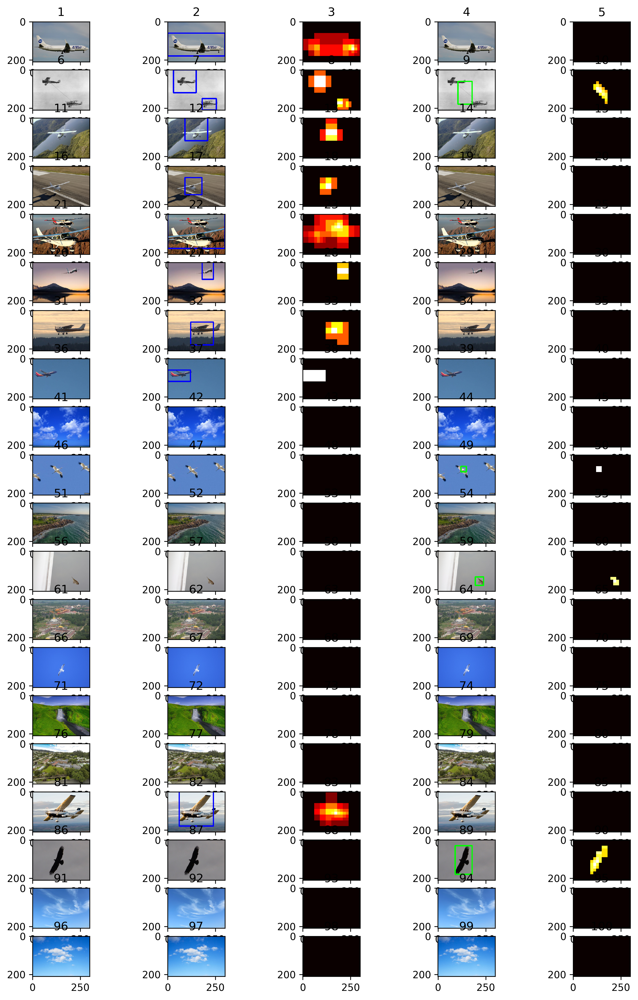

In [33]:
fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, len(example_images), 5, out_images_labels)

# Column 1 - original test image |
# Column 2 - aircraft detections bounding boxes |
# Column 3 - aircraft detections heatmap - thresholded  |
# Column 4 - birds detections bounding boxes |
# Column 5 - birds detections heatmap - thresholded

In [34]:
#plt.imshow(window_img)
for i, img in enumerate(out_images_labels):
    plt.imsave('test_images_results/out_images_labels_2/'+str(i+1)+'.png',out_images_labels[i])

## Create a complete pipeline for end-to-end image processing 

In [35]:
threshold_aircraft = 1
threshold_birds = 6
color_aircraft = (0,0,255) #blue
color_birds = (0,255,0) #green

def process_image(img):
    #mask actually corresponds to the region of interest in which the classification will take place
    mask = ((0,img.shape[0]/2), (0,img.shape[1]))
    #heatmap_aircraft, heatmap_birds = detect_objects(img, scales, overlap)
    heatmap_aircraft, heatmap_birds = detect_objects(img, scales, overlap, mask)
    heatmap_aircraft_th = apply_threshold(heatmap_aircraft, threshold_aircraft)
    heatmap_birds_th = apply_threshold(heatmap_birds, threshold_birds)
    
    labels_aircraft = label(heatmap_aircraft_th)
    draw_img_aircraft, bbox_aircraft = draw_labeled_bboxes(np.copy(img), labels_aircraft, color_aircraft)

    if bbox_aircraft is not None:
        heatmap_birds_th[bbox_aircraft[0][1]:bbox_aircraft[1][1], bbox_aircraft[0][0]:bbox_aircraft[1][0]] = 0
    labels_birds = label(heatmap_birds_th)
    draw_img_aircraft_birds, bbox_birds = draw_labeled_bboxes(draw_img_aircraft, labels_birds, color_birds)
    
    final_img = draw_img_aircraft_birds
    
    return final_img

## Test the pipeline on a single image with mask applied - only top image part is analysed

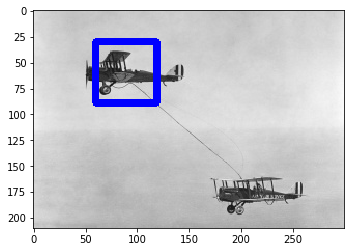

In [36]:
# Test the pipeline on one image with the region of interest in the upper part of the image - bottom part is not analysed!
img = mpimg.imread(example_images[1])
final_img = process_image(img)
plt.imshow(final_img)

## Run end-to-end pipeline on a sample of a video - video 1 

In [37]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

result_output = 'test_videos/2FNB737_result_png.avi'
clip = VideoFileClip("test_videos/2FNB737.avi")
test_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
%time test_clip.write_videofile(result_output, codec = 'png', audio=False)
#%time test_clip.write_videofile(result_output, codec = 'rawvideo', audio=False)

[MoviePy] >>>> Building video test_videos/2FNB737_result_png.avi
[MoviePy] Writing video test_videos/2FNB737_result_png.avi


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 317/318 [59:48<00:11, 11.30s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos/2FNB737_result_png.avi 

Wall time: 59min 48s


In [38]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(result_output))

## Run end-to-end pipeline on a sample of a video - video 1 (w/ new hyper-parameters)

In [44]:
#new hyper-parameters are new mask (region of interest), new overlaps, new scales and new thresholds for heatmaps
scales = [0.1, 0.05, 0.02]
overlap = 0.75
threshold_aircraft = 0
threshold_birds = 3

def process_partial_image(img):
    mask = ((int(round(img.shape[0]/6)),int(round(img.shape[0]/2))), (int(round(2*img.shape[1]/5)),int(round(3*img.shape[1]/5))))
    heatmap_aircraft, heatmap_birds = detect_objects(img, scales, overlap, mask)
    heatmap_aircraft_th = apply_threshold(heatmap_aircraft, threshold_aircraft)
    heatmap_birds_th = apply_threshold(heatmap_birds, threshold_birds)
    
    labels_aircraft = label(heatmap_aircraft_th)
    draw_img_aircraft, bbox_aircraft = draw_labeled_bboxes(np.copy(img), labels_aircraft, color_aircraft)

    if bbox_aircraft is not None:
        heatmap_birds_th[bbox_aircraft[0][1]:bbox_aircraft[1][1], bbox_aircraft[0][0]:bbox_aircraft[1][0]] = 0
    labels_birds = label(heatmap_birds_th)
    #draw_img_birds, bbox_birds = draw_labeled_bboxes(np.copy(img), labels_birds, color_birds)
    draw_img_aircraft_birds, bbox_birds = draw_labeled_bboxes(draw_img_aircraft, labels_birds, color_birds)
    
    final_img = draw_img_aircraft_birds
    
    return final_img

In [ ]:
result_output = 'test_videos/2FNB737_result_png_mask.avi'
clip = VideoFileClip("test_videos/2FNB737.avi")
test_clip = clip.fl_image(process_partial_image) #NOTE: this function expects color images!!
%time test_clip.write_videofile(result_output, codec = 'png', audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(result_output))